<a href="https://www.kaggle.com/code/owentamunogilbert/new-york-hospital-charges-analysis?scriptVersionId=285954828" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hospital-inpatient-discharges/Hospital_Inpatient_Discharges__SPARCS_De-Identified___2024.csv


<font size='10'><b>Hospital Inpatient Charges</font>

# Importing Libraries and Loading the Data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import math
import textwrap
import warnings

warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("/kaggle/input/hospital-inpatient-discharges/Hospital_Inpatient_Discharges__SPARCS_De-Identified___2024.csv")

In [4]:
pd.options.display.max_columns = None

In [5]:
df.head()

,Health Service Area,Hospital County,Operating Certificate Number,Permanent Facility Id,Facility Name,Age Group,Zip Code,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,Discharge Year,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator,Total Charges,Total Costs
0,Hudson Valley,Westchester,5957001.0,1139.0,WESTCHESTER MEDICAL CENTER,0-17,OOS,F,White,Not Span/Hispanic,1,Emergency,Home or Self Care,2024,SYM002,FEVER,NaN,NaN,722,FEVER AND INFLAMMATORY CONDITIONS,18,"INFECTIOUS AND PARASITIC DISEASES, SYSTEMIC OR...",2,Moderate,Minor,Medical,Private Health Insurance,NaN,NaN,NaN,Y,46814.00,6772.07
1,New York City,Queens,7003001.0,1628.0,FLUSHING HOSPITAL MEDICAL CENTER,0-17,113,M,White,Spanish/Hispanic,2,Emergency,Home or Self Care,2024,SYM002,FEVER,NaN,NaN,722,FEVER AND INFLAMMATORY CONDITIONS,18,"INFECTIOUS AND PARASITIC DISEASES, SYSTEMIC OR...",2,Moderate,Moderate,Medical,Medicaid,NaN,NaN,NaN,Y,13490.00,15464.30
2,New York City,New York,7002054.0,1458.0,NEW YORK-PRESBYTERIAN HOSPITAL - NEW YORK WEIL...,70 or Older,100,M,White,Not Span/Hispanic,2,Emergency,Home or Self Care,2024,SYM002,FEVER,ADM012,CHEMOTHERAPY,722,FEVER AND INFLAMMATORY CONDITIONS,18,"INFECTIOUS AND PARASITIC DISEASES, SYSTEMIC OR...",2,Moderate,Moderate,Medical,Medicare,Private Health Insurance,NaN,NaN,Y,49503.16,9324.77
3,New York City,New York,7002054.0,1464.0,NEW YORK-PRESBYTERIAN HOSPITAL - COLUMBIA PRES...,0-17,100,F,Other Race,Not Span/Hispanic,1,Emergency,Home or Self Care,2024,SYM002,FEVER,CNS002,LUMBAR PUNCTURE,722,FEVER AND INFLAMMATORY CONDITIONS,18,"INFECTIOUS AND PARASITIC DISEASES, SYSTEMIC OR...",1,Minor,Minor,Medical,Private Health Insurance,NaN,NaN,2700,Y,27827.66,7304.27
4,New York City,New York,7002032.0,1466.0,MOUNT SINAI WEST,18-29,100,F,Other Race,Spanish/Hispanic,1,Emergency,Home or Self Care,2024,SYM002,FEVER,ADM021,"ADMINISTRATION OF THERAPEUTIC SUBSTANCES, NEC",722,FEVER AND INFLAMMATORY CONDITIONS,18,"INFECTIOUS AND PARASITIC DISEASES, SYSTEMIC OR...",2,Moderate,Minor,Medical,Medicare,NaN,NaN,NaN,Y,32798.29,7948.10


# Explore and Understand the Data

## Data Overview

In [6]:
print(f'The data has {df.shape[0]} data points and {df.shape[1]} variables')

The data has 2196737 data points and 33 variables


In [7]:
df.columns

Index(['Health Service Area', 'Hospital County',
       'Operating Certificate Number', 'Permanent Facility Id',
       'Facility Name', 'Age Group', 'Zip Code', 'Gender', 'Race', 'Ethnicity',
       'Length of Stay', 'Type of Admission', 'Patient Disposition',
       'Discharge Year', 'CCSR Diagnosis Code', 'CCSR Diagnosis Description',
       'CCSR Procedure Code', 'CCSR Procedure Description', 'APR DRG Code',
       'APR DRG Description', 'APR MDC Code', 'APR MDC Description',
       'APR Severity of Illness Code', 'APR Severity of Illness Description',
       'APR Risk of Mortality', 'APR Medical Surgical Description',
       'Payment Typology 1', 'Payment Typology 2', 'Payment Typology 3',
       'Birth Weight', 'Emergency Department Indicator', 'Total Charges',
       'Total Costs'],
      dtype='object')

In [8]:
df.columns

Index(['Health Service Area', 'Hospital County',
       'Operating Certificate Number', 'Permanent Facility Id',
       'Facility Name', 'Age Group', 'Zip Code', 'Gender', 'Race', 'Ethnicity',
       'Length of Stay', 'Type of Admission', 'Patient Disposition',
       'Discharge Year', 'CCSR Diagnosis Code', 'CCSR Diagnosis Description',
       'CCSR Procedure Code', 'CCSR Procedure Description', 'APR DRG Code',
       'APR DRG Description', 'APR MDC Code', 'APR MDC Description',
       'APR Severity of Illness Code', 'APR Severity of Illness Description',
       'APR Risk of Mortality', 'APR Medical Surgical Description',
       'Payment Typology 1', 'Payment Typology 2', 'Payment Typology 3',
       'Birth Weight', 'Emergency Department Indicator', 'Total Charges',
       'Total Costs'],
      dtype='object')

## For categorical variables

In [9]:
df.describe(include='object')

,Health Service Area,Hospital County,Facility Name,Age Group,Zip Code,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator
count,2191442,2191442,2196737,2196737,2154765,2196737,2196737,2196737,2196737,2196737,2196737,2196737,2196737,1552973,1552973,2196737,2196737,2196737,2196737,2196737,2196510,992329,240038,207822,2196737
unique,8,57,203,5,50,3,4,4,120,6,19,478,478,320,320,336,26,5,5,3,9,9,9,121,2
top,New York City,New York,MOUNT SINAI HOSPITAL,70 or Older,112,F,White,Not Span/Hispanic,2,Emergency,Home or Self Care,PNL001,LIVEBORN,PGN002,SPONTANEOUS VAGINAL DELIVERY,"NEONATE BIRTH WEIGHT > 2499 GRAMS, NORMAL NEWB...",DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,Moderate,Minor,Medical,Medicare,Medicaid,Self-Pay,3200,Y
freq,996124,389375,53353,706970,266231,1195617,1147354,1540538,464690,1460204,1441830,199274,199274,115706,115706,168494,277625,820465,1108093,1686244,929267,420954,124253,9156,1377141


> Some columns may not be necessary, e.g. `Zip Code`,
>
> We also need to investigate similar columns like `Race` and `Ethnicity` to see if they can be combined or cleaned up.
>
> Why is `Length of Stay` and `Birth Weight` an object and not a numeric type?
>
> Investiage the 3 `Payment Typology` columns to see if they can be combined or cleaned up.
>
> There are blanks in the data

In [10]:
df['Birth Weight'].unique()

array([nan, '2700', '3300', '3900', '3000', '3200', '4300', '3600',
       '3100', '3700', '4600', '3400', '3500', '4500', '4000', '3800',
       '2900', '2600', '2800', '4400', '4100', '2500', '4200', '2300',
       '1900', '1500', '4800', '4900', '5100', '2200', '5000', '2000',
       '2100', '2400', '500', '1000', '900', '1600', '700', '800', '1700',
       '1400', '4700', 'UNKN', '1300', '1800', '1100', '1200', '400',
       '600', '7500', '5200', 3200.0, 2600.0, 3000.0, 3900.0, 3800.0,
       2900.0, 4000.0, 3300.0, 3600.0, 3500.0, 3700.0, 3400.0, 3100.0,
       2500.0, 2800.0, 2700.0, 4100.0, 2200.0, 2300.0, 1500.0, 1700.0,
       2400.0, 1600.0, 2000.0, 1800.0, 4200.0, 2100.0, 1100.0, 4300.0,
       4400.0, 1900.0, 1300.0, 1400.0, 600.0, '5400', 900.0, 4500.0,
       1000.0, 1200.0, 4600.0, 400.0, 800.0, 500.0, 7700.0, 5400.0, 700.0,
       4800.0, 4900.0, 5100.0, 5300.0, 4700.0, 5000.0, '8000', '5300',
       5200.0, 5600.0, 7100.0, '9000', '5700', '5600', 5500.0, '6100',
     

> `Birth Weight` contains 'UNKN' as a value

In [11]:
df['Length of Stay'].unique()

array(['1', '2', '3', '8', '9', '5', '4', '28', '6', '32', '48', '7',
       '22', '18', '13', '39', '11', '120+', '63', '114', '70', '80',
       '31', '12', '21', '26', '77', '74', '10', '15', '14', '88', '52',
       '24', '72', '23', '16', '17', '42', '20', '19', '25', '36', '51',
       '41', '29', '38', '37', '27', '119', '30', '35', '94', '83', '43',
       '33', '45', '34', '47', '71', '44', '57', '60', '61', '40', '68',
       '113', '58', '54', '53', '69', '78', '50', '91', '55', '90', '49',
       '65', '62', '64', '105', '89', '59', '102', '85', '46', '67',
       '104', '79', '99', '117', '66', '100', '93', '92', '109', '86',
       '111', '97', '95', '75', '96', '115', '73', '56', '116', '84',
       '76', '87', '101', '103', '81', '118', '82', '112', '110', '108',
       '98', '106', '107'], dtype=object)

In [12]:
for col in df.select_dtypes(include='object').columns:
    if df[col].unique().size < 20:
        print(f'{col} has {df[col].unique().size} unique values: ')
        print(f'{df[col].unique()}\n')

Health Service Area has 9 unique values: 
['Hudson Valley' 'New York City' 'Long Island' 'Finger Lakes' 'Central NY'
 'Capital/Adirondacks' 'Western NY' nan 'Southern Tier']

Age Group has 5 unique values: 
['0-17' '70 or Older' '18-29' '30-49' '50-69']

Gender has 3 unique values: 
['F' 'M' 'U']

Race has 4 unique values: 
['White' 'Other Race' 'Black/African American' 'Multi-racial']

Ethnicity has 4 unique values: 
['Not Span/Hispanic' 'Spanish/Hispanic' 'Unknown' 'Multi-ethnic']

Type of Admission has 6 unique values: 
['Emergency' 'Elective' 'Trauma' 'Newborn' 'Urgent' 'Not Available']

Patient Disposition has 19 unique values: 
['Home or Self Care' 'Left Against Medical Advice' 'Skilled Nursing Home'
 'Home w/ Home Health Services' 'Short-term Hospital'
 'Cancer Center or Childrens Hospital' 'Expired'
 'Inpatient Rehabilitation Facility'
 'Psychiatric Hospital or Unit of Hosp' 'Hospice - Home'
 'Another Type Not Listed' 'Facility w/ Custodial/Supportive Care'
 'Hospice - Medical 

> Most values for `Payment Typology 1`, `Payment Typology 2`, `Payment Typology 3` are the same, so we need combine (if possible), and drop.
>
> `Emergency Deparment Indicator` would be better as _Yes_ and *No*

## For numerical variables

In [13]:
df.describe()

,Operating Certificate Number,Permanent Facility Id,Discharge Year,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs
count,2.191442e+06,2.191442e+06,2196737.0,2.196737e+06,2.196737e+06,2.196737e+06,2.196737e+06,2.196737e+06
mean,5.087132e+06,1.279496e+03,2024.0,4.143324e+02,1.030294e+01,2.145497e+00,9.062543e+04,2.641658e+04
std,2.245914e+06,1.869344e+03,0.0,2.440963e+02,5.985493e+00,9.252315e-01,1.894022e+05,5.537229e+04
min,1.010000e+05,1.000000e+00,2024.0,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.953000e+06,5.410000e+02,2024.0,1.940000e+02,5.000000e+00,1.000000e+00,2.357638e+04,7.415880e+03
50%,5.957001e+06,1.117000e+03,2024.0,3.830000e+02,9.000000e+00,2.000000e+00,4.724379e+04,1.411045e+04
75%,7.002032e+06,1.456000e+03,2024.0,6.400000e+02,1.500000e+01,3.000000e+00,9.451516e+04,2.778834e+04
max,7.004010e+06,1.562000e+04,2024.0,9.560000e+02,2.500000e+01,4.000000e+00,1.969486e+07,6.701232e+06


> `Discharge Year` is not necessary as it is completely 2024 all through

# Data Cleaning and Preparation

## Issues

While previewing the data, we noticed some issues that need to be addressed:

* The `Zip Code` column is not necessary for our analysis.
* The `Discharge Year` column is redundant since all entries are from 2024.
* The `Length of Stay` and `Birth Weight` columns are currently of object type, which should be converted to numeric types.
* The `Race` and `Ethnicity` columns need to be cleaned up to ensure consistency.
* There are some missing values in the dataset that need to be handled.
* 


In [14]:
df.isnull().sum()

Health Service Area                       5295
Hospital County                           5295
Operating Certificate Number              5295
Permanent Facility Id                     5295
Facility Name                                0
Age Group                                    0
Zip Code                                 41972
Gender                                       0
Race                                         0
Ethnicity                                    0
Length of Stay                               0
Type of Admission                            0
Patient Disposition                          0
Discharge Year                               0
CCSR Diagnosis Code                          0
CCSR Diagnosis Description                   0
CCSR Procedure Code                     643764
CCSR Procedure Description              643764
APR DRG Code                                 0
APR DRG Description                          0
APR MDC Code                                 0
APR MDC Descr

> Columns to be dropped:

* `Operating Certificate Number`: Irrelevant
* `Permanent Facility Id`: Irrelevant
* `Facility Name`: the model may memorize hospital-specific averages instead of learning general patterns (causing overfitting)
* `Discharge Year`: Redundant, all entries are from 2024
* `Zip Code`: Irrelevant for analysis
* `Birth Weight`: Too many missing values

## Dropping Columns

In [15]:
df.drop(columns=['Operating Certificate Number', 'Permanent Facility Id', 'Discharge Year', 'Zip Code', 'Birth Weight', 'Facility Name'],inplace=True)

## Dealing with Blanks

> We'll be dropping blanks in `Health Service Area` and `Hospital County`
>
> The blanks in CCSR procedure will be replaced with *No Procedure*
>
> The blanks in `Payment Typology 1` will be replaced with values in `Payment Typology 2` and *None*

In [16]:
df.isnull().sum()

Health Service Area                       5295
Hospital County                           5295
Age Group                                    0
Gender                                       0
Race                                         0
Ethnicity                                    0
Length of Stay                               0
Type of Admission                            0
Patient Disposition                          0
CCSR Diagnosis Code                          0
CCSR Diagnosis Description                   0
CCSR Procedure Code                     643764
CCSR Procedure Description              643764
APR DRG Code                                 0
APR DRG Description                          0
APR MDC Code                                 0
APR MDC Description                          0
APR Severity of Illness Code                 0
APR Severity of Illness Description          0
APR Risk of Mortality                        0
APR Medical Surgical Description             0
Payment Typol

In [17]:
df.dropna(subset=['Health Service Area', 'Hospital County'], inplace=True)

In [18]:
df['CCSR Procedure Code'].fillna('NO_PROC', inplace=True)
df['CCSR Procedure Description'].fillna('No Procedure', inplace=True)

In [19]:
df.loc[df['Payment Typology 1'].isnull(),['Payment Typology 1', 'Payment Typology 2', 'Payment Typology 3']]

,Payment Typology 1,Payment Typology 2,Payment Typology 3
1141,NaN,Medicaid,NaN
9454,NaN,Medicare,NaN
23208,NaN,Medicaid,NaN
25138,NaN,Medicaid,NaN
25359,NaN,NaN,NaN
...,...,...,...
2142217,NaN,NaN,NaN
2164970,NaN,NaN,NaN
2175237,NaN,NaN,NaN
2183444,NaN,Federal/State/Local/VA,NaN


In [20]:
df['Payment Typology 1'].fillna(df['Payment Typology 2'],inplace=True)

In [21]:
df['Payment Typology 1'].fillna('None', inplace=True)

In [22]:
df.drop(columns=['Payment Typology 2', 'Payment Typology 3'], inplace=True)

## Dropping 'Unknown' Gender

In [23]:
df = df[df['Gender']!='U']

## Correcting Data Types

In [24]:
df.dtypes

Health Service Area                     object
Hospital County                         object
Age Group                               object
Gender                                  object
Race                                    object
Ethnicity                               object
Length of Stay                          object
Type of Admission                       object
Patient Disposition                     object
CCSR Diagnosis Code                     object
CCSR Diagnosis Description              object
CCSR Procedure Code                     object
CCSR Procedure Description              object
APR DRG Code                             int64
APR DRG Description                     object
APR MDC Code                             int64
APR MDC Description                     object
APR Severity of Illness Code             int64
APR Severity of Illness Description     object
APR Risk of Mortality                   object
APR Medical Surgical Description        object
Payment Typol

> We'll cap `Length of Stay` at 120 days

In [25]:
df['Length of Stay'] = df['Length of Stay'].replace({'120+':120})

In [26]:
df['Length of Stay'] = pd.to_numeric(df['Length of Stay'], errors='raise')

> `APR DRG` and `APR MDC` codes are not numerical but categorical
>

# Exploratory Data Analysis

- Default Plot Settings:

In [27]:
plt.rcParams.update({'axes.labelweight':'bold', 'axes.labelcolor':'#323232','legend.edgecolor':"brown",
                    'axes.grid':True,'grid.color':'#BFBFBF','grid.linestyle':'--','legend.frameon':True,'axes.edgecolor':'#323232',
                    'axes.titlecolor':"#323232",'axes.titleweight':'bold','figure.edgecolor':'red','figure.facecolor':'lightgray'})


## Univariate Analysis

### Distribution of Total Charges and Total Costs

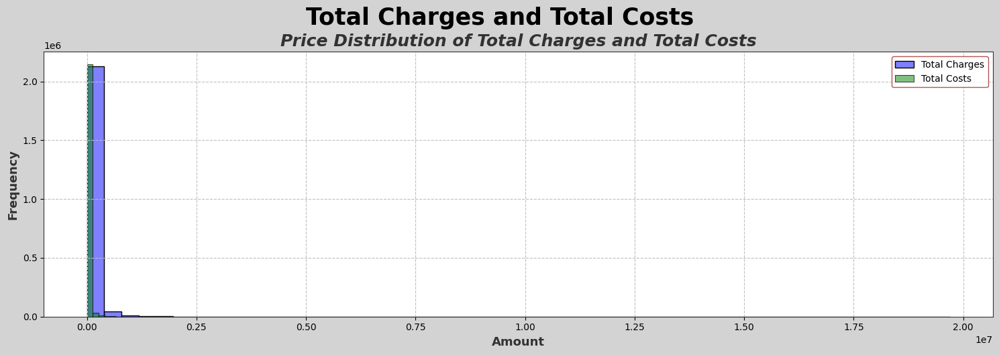

In [28]:
plt.figure(figsize=(15, 5))
sns.histplot(df['Total Charges'], bins=50, color='blue', label='Total Charges', edgecolor='black',alpha=0.5)
sns.histplot(df['Total Costs'], bins=50, color='green', label='Total Costs', edgecolor='black',alpha=0.5)

plt.xlabel("Amount", fontsize=13)
plt.ylabel("Frequency", fontsize=13)
plt.legend(fontsize=10)
plt.tick_params(labelsize=10)

plt.title("Price Distribution of Total Charges and Total Costs", fontsize=18, fontstyle='italic')
plt.tight_layout()
plt.suptitle('Total Charges and Total Costs',y=1.05,weight='bold',fontsize=25)
plt.show()

> `Total Charges` and `Total Costs` have a right-skewed distribution, indicating that most hospital stays are relatively inexpensive, 
while a few cases incur very high costs.
>
> The histogram shows that the majority of hospital stays have `Total Charges` and costs below $100,000, with a many outliers extending beyond this range.
>
> This suggests that while most patients incur moderate expenses, a large number of cases result in significantly higher charges and costs, possibly due to complex medical conditions or extended hospital stays.
>
> `Total Charges` are generally higher than `Total Costs`, which is expected as charges include additional fees beyond the direct costs of care.

### Most Frequent Values

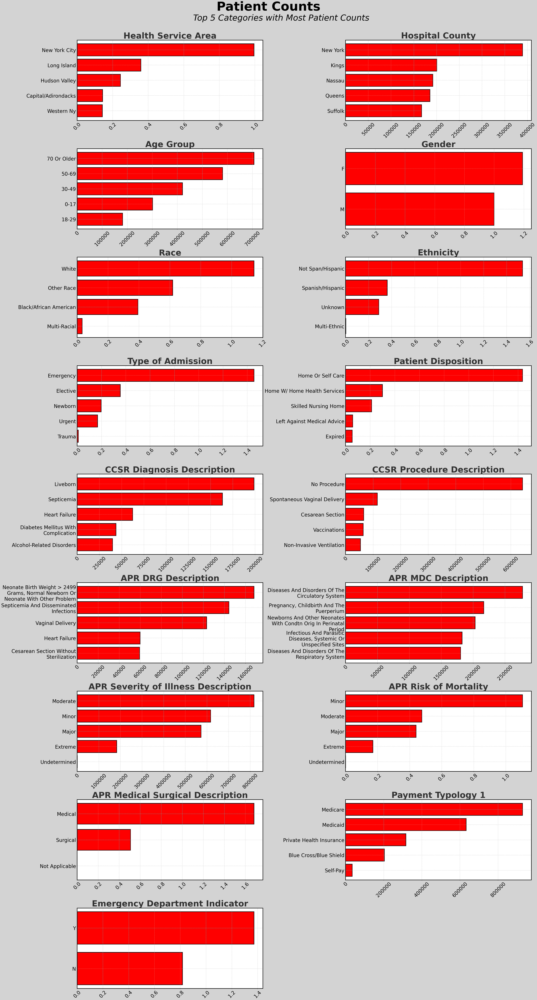

In [29]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower()]

top5 = {col: df[col].value_counts().head() for col in plot_cols}

n_cols = 2
n_rows = math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows, n_cols, figsize=(45,9*n_rows))
axes = axes.flatten()

for ax,col in zip(axes,plot_cols):
    counts = top5[col][::-1]
    labels = counts.index.tolist()

    wrapped_labels = [textwrap.fill(label.title(), width=30) for label in labels]

    ax.barh(wrapped_labels,counts.values, color='red',edgecolor='black',linewidth=3)

    ax.set_title(f'{col}',fontsize=50)
    ax.set_xlabel('')
    ax.set_ylabel('')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_yticks(range(len(wrapped_labels)))
    ax.set_yticklabels(wrapped_labels)
    ax.tick_params(labelsize=30)

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)

    
for i in range(len(plot_cols),len(axes)):
    fig.delaxes(axes[i])


plt.tight_layout()
plt.suptitle('Patient Counts',y=1.03, weight='bold', fontsize=75)
plt.figtext(0.36,1.01,'Top 5 Categories with Most Patient Counts',style='italic',fontsize=50,)
plt.show()

> The count plots show the most frequent values for various categorical variables in the dataset:
>
> Most cases were in 'New York City' `Health Service Area` and 'New York' `County`
>
> There were more 'Female' than 'Male' cases and most common `Age Group` were patients 70 years and above.
>
> The `Race` is diverse but mostly 'White', and mostly 'Non Spanish/Hispanic' `Ethnicity`
>
> Most patients were admitted as 'Emergencies'
>
> Most cases were covered by 'Private Health Insurance'
>
> Aside from 'Undetermined' severity cases, 'Extreme' cases were the least cases which reflected in  having mostly 'Minor' cases of `Risk of Mortality`
>
> `Race` and `Ethnicity` variables show a diverse population, with the majority being White and Non-Hispanic and their are more females in each population.
>
> `Payment Typology 1` shows a variety of payment methods, with the most common being 'Medicare' and 'Medicaid'.
>
> `Health Service Area` show a diverse distribution across different regions, indicating that the dataset includes data from various locations, with most of the patients from 'New York City' with over twice more patients than the next largest area 'Long Island'. This implies that the dataset is heavily influenced by activites in 'New York City', which could be revealing its larger population, hence, higher hospital utilization rates.
>
> Approx. 1.5million patients from a total of about 2.2 million were discharged 'Home or Self Care' representing about 68% of the `Patient Disposition`, indicating a high success rate of treatment and recovery in the hospital setting. This suggests that most patients were stabilized sufficiently to continue recovery outside of inpatient care.
>
> The `APR Severity of Illness Description` variable show a range of severity levels and diagnosis-related groups, indicating that the dataset includes a variety of patient conditions, which is mostly 'Moderate'. For 'Extreme' cases, the majority of patients were males unlike the others
>
> The `APR Medical Surgical Description` variable shows there was less surgical procedures performed, with most patients having a medical condition rather than a surgical one.
>
> The `Emergency Department Indicator` variable shows that a significant portion of the patients were admitted through the emergency department, indicating the importance of emergency care in hospital admissions.

## Bivariate Analysis

### Count of Categorical Variables by Gender

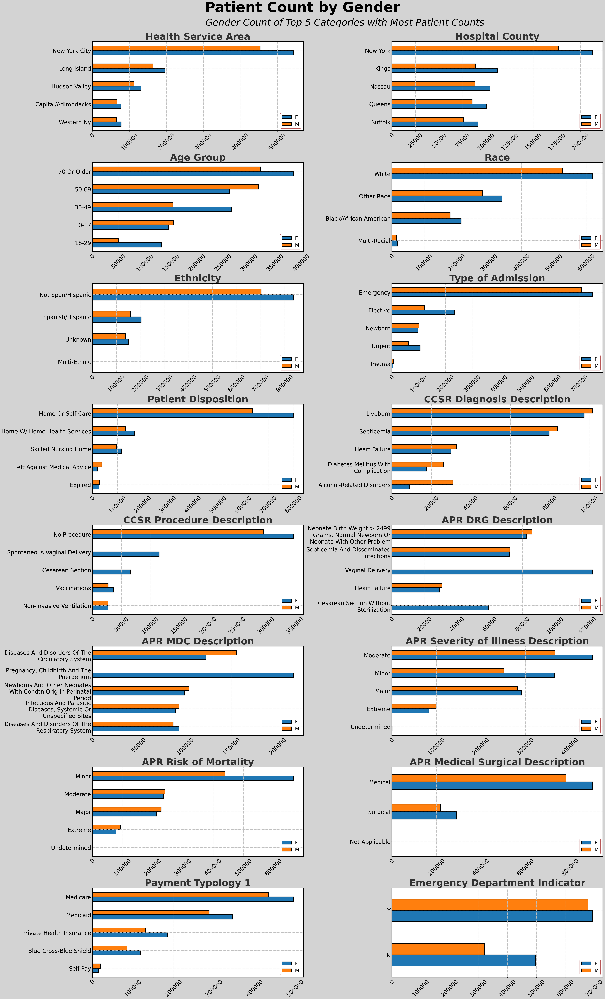

In [30]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower() and col.lower()!='gender']

top5_per_col = {col: df[col].value_counts().head().index.tolist() for col in plot_cols}

grouped = {col: df.groupby([col, 'Gender']).size().reset_index(name='count') for col in plot_cols}
    
n_cols = 2
n_rows = math.ceil(len(plot_cols)/n_cols)


fig,axes = plt.subplots(n_rows,n_cols, figsize=(45,9*n_rows))
axes = axes.flatten()

for ax, col in zip(axes,plot_cols):
    top5 = top5_per_col[col]
    top5 = top5[::-1]
    g = grouped[col][grouped[col][col].isin(top5)]

    wrapped_labels = [textwrap.fill(label.title(),width=30) for label in top5]

    pivot = (g.pivot(index=col, columns='Gender', values='count').reindex(top5).fillna(0))

    pivot.plot.barh(ax=ax,edgecolor='black',linewidth=3)
    ax.set_title(f'{col}',weight='bold',fontsize=50)
    ax.set_xlabel('')
    ax.set_ylabel('')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_yticks(range(len(top5)))
    ax.set_yticklabels(wrapped_labels)
    ax.tick_params(labelsize=30)
    ax.legend(fontsize=25,loc='lower right')

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)
    
plt.tight_layout()
plt.suptitle('Patient Count by Gender', y=1.03, fontsize=75, weight='bold')
plt.figtext(0.34,1.005,'Gender Count of Top 5 Categories with Most Patient Counts',style='italic',fontsize=50,)
plt.show()

> The count plots show the distribution of various categorical variables by `Gender` in the dataset
>
> There are mostly 'Females' than 'Males' in most category of variables. The anomalies to this pattern occurred significantly in:

 *  '50-69' `Age Group`,
 *  `Type of Admission` was 'Newborns',
 *  Patients who 'Left Against Medical Advice',
 *  The top 5 `CCSR Diagnosis` which includes - 'Alcohol-Related Disorders', 'Liveborn', 'Heart Failure', 'Diabetes with Complications'
 *  'Diseases and Disorders of the Circulatory system' in `APR MDC Description`
 *  'Extreme' `Severity of Illness` and in 'Moderate', 'Major' and 'Extreme' `Risk of Mortality`
> 


### Average Total Charges of Categorical Variables

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

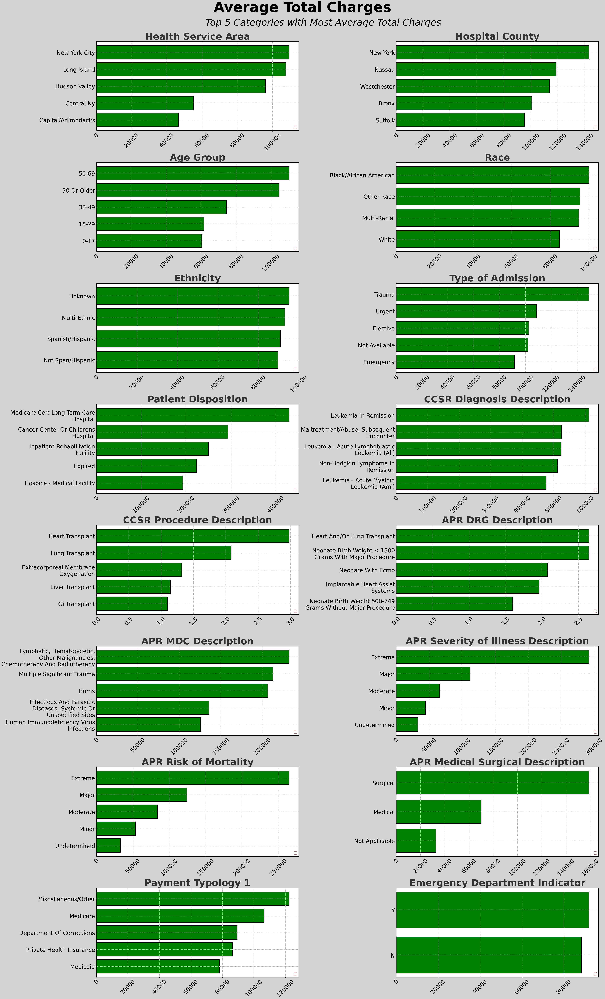

In [31]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower() and col.lower()!='gender']
top5_per_col = {col: df.groupby(col)['Total Charges'].mean().sort_values(ascending=False).head() for col in plot_cols}

n_cols=2
n_rows=math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows,n_cols,figsize=(45,9*n_rows))
axes = axes.flatten()

for ax,col in zip(axes,plot_cols):
    top5 = top5_per_col[col][::-1]
    
    wrapped_labels = [textwrap.fill(label.title(),width=30) for label in top5.index.tolist()]

    ax.barh(wrapped_labels,top5.values,color='green',edgecolor='black',linewidth=3)

    ax.set_title(col,weight='bold',fontsize=50)
    ax.set_ylabel('')
    ax.set_yticklabels(wrapped_labels)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels() ,rotation=45)
    ax.tick_params(labelsize=30)
    ax.legend(fontsize=20,loc='lower right')

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)

plt.tight_layout()
plt.suptitle('Average Total Charges', fontsize=75,y=1.03,weight='bold')
plt.figtext(0.34,1.005,'Top 5 Categories with Most Average Total Charges',style='italic',fontsize=50,)
plt.show()

> The bar plots show the average total charges for different categorical variables in the dataset, segmented by `Gender`
>
> 'New York City' has the highest average total costs, followed closely by 'Long Island', indicating that patients in 'New York City' incur higher charges on average compared to other regions.
>
> Average `Total Charges` is significantly higher for patients above 50 years
>
> 'Heart and Lung Transplants' are the procedures with the highest average `Total Charges`, 'Heart Transplant' being the most expensive
>
> The `Payment Typology 1` variable shows that 'Miscellaneous' payment types have the highest average total charges, followed by 'Medicaid' and 'Medicare'. This suggests that patients with miscellaneous payment types tend to incur higher charges on average.
>
> The `APR Severity of Illness Description` and `APR Risk of Mortality` variables show that patients with 'Extreme' severity of illness incur the highest average total charges, followed by 'Major' and 'Moderate'. This indicates that with more severe conditions there'll be higher charges.
>
> 'Trauma' cases have the highest average `Total Charges`. This suggests that trauma cases tend to be more expensive on average compared to other types of cases.
>
> Patients disposed to 'Medicare Cert Long Term Care Hospital' have the highest average `Total Charges`, followed by 'Cancer Center or Children's Hospital' and 'Inpatient Rehabilitation Facility'. This trend suggests that patients requiring transfer to long-term or specialized care facilities typically have more complex medical conditions and longer lengths of stay, leading to higher overall hospital charges compared to other discharge destinations. The elevated costs likely reflect the intensity of care, advanced treatments, and extended hospitalization periods associated with these patient groups.
>
> `APR Medical Surgical Description` shows patients 'Surgical' Conditions are more expensive on an average, and 'Male' surgical patients incur a sginificantly higher `Total Charges` than 'Female' surgical patients.
>
> The average `Total Charges` of 'Males' is higher than that of 'Females' in almost all variables, even though we had more 'Female' cases. This could be revealing a potential bias in the healthcare system or be as a result of more 'Extreme' cases
>
> The `Emergency Department Indicator` shows that patients admitted through the emergency department do not incur higher average total charges compared to those not admitted through the emergency department, indicating that emergency admissions tend to be less costly.

### Average Total Charges by Gender of Categorical Variables

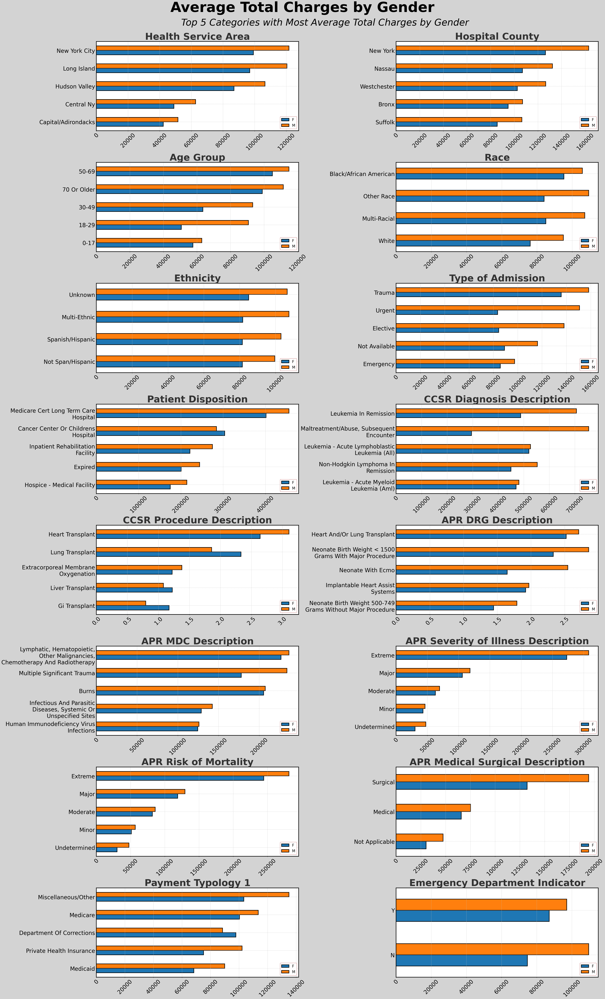

In [32]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower() and col.lower()!='gender']
top5_per_col = {col: df.groupby(col)['Total Charges'].mean().sort_values(ascending=False).head().index.tolist() for col in plot_cols}

grouped = {col: df.groupby([col,'Gender'])['Total Charges'].mean().reset_index(name='Average Charge') for col in plot_cols}


n_cols=2
n_rows=math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows,n_cols,figsize=(45,9*n_rows))
axes = axes.flatten()

for ax,col in zip(axes,plot_cols):
    top5 = top5_per_col[col]
    top5 = top5[::-1]

    wrapped_labels = [textwrap.fill(label.title(),width=30) for label in top5]

    g = grouped[col][grouped[col][col].isin(top5)]
    pivot = g.pivot(index=col,columns='Gender',values='Average Charge').reindex(top5).fillna(0)

    pivot.plot.barh(ax=ax,edgecolor='black',linewidth=3)

    ax.set_title(col,weight='bold',fontsize=50)
    ax.set_ylabel('')
    ax.set_yticklabels(wrapped_labels)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels() ,rotation=45)
    ax.tick_params(labelsize=30)
    ax.legend(fontsize=20,loc='lower right')

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)

plt.tight_layout()
plt.suptitle('Average Total Charges by Gender', fontsize=75,y=1.03,weight='bold')
plt.figtext(0.3,1.005,'Top 5 Categories with Most Average Total Charges by Gender',style='italic',fontsize=50,)
plt.show()

> The plots reveal the average `Total Charges` by Gender for each variable
>
> It is clear the the average `Total Charges` is commonly higher in males in almost all categories, with exception in:

* Patients disposed to 'Cancer Center ot Children's Hospital'
* Procedures involving 'Lung Transplant','Liver Transplant' and 'Gi Transplant'
* Payments by 'Department of Corrections'

### Charge to Cost Ratio by Category Analysis

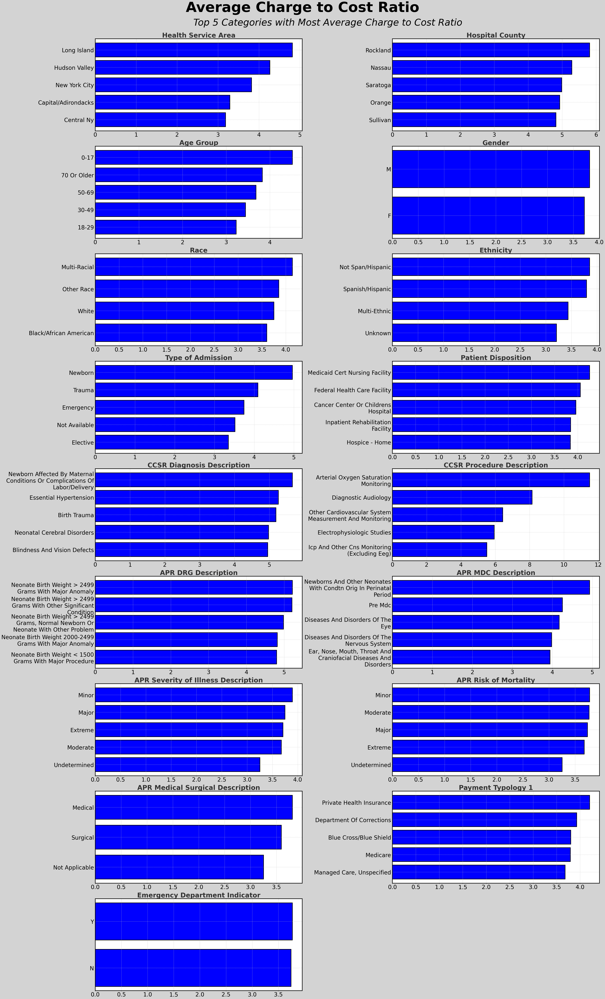

In [33]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower()]

df['CCR'] =  df['Total Charges'] / df['Total Costs']

top5_per_col = {col: df.groupby(col)['CCR'].mean().sort_values(ascending=False).head() for col in plot_cols}

n_cols=2
n_rows=math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows,n_cols,figsize=(45,8*n_rows))
axes = axes.flatten()

for ax,col in zip(axes,plot_cols):
    top5 = top5_per_col[col]
    top5 = top5[::-1]
    labels = top5.index.tolist()

    wrapped_labels = [textwrap.fill(label.title(),width=30) for label in labels]
    
    ax.barh(wrapped_labels, top5.values, color='blue',edgecolor='black',linewidth=3)

    ax.set_ylabel('')
    ax.set_yticklabels(wrapped_labels)
    ax.set_title(col,fontsize=35,weight='bold')
    ax.tick_params(labelsize=30)

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)

for i in range(len(plot_cols),len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.suptitle('Average Charge to Cost Ratio', weight='bold',y=1.03,fontsize=75)
plt.figtext(0.32,1.005,'Top 5 Categories with Most Average Charge to Cost Ratio',style='italic',fontsize=50,)
plt.show()

> The bar plots show the average Charge to Cost Ratio (CCR) for different categorical variables in the dataset
>
> The `Health Service Area` variable shows that 'Long Island' has the highest average CCR, indicating that patients in 'Long Island' incur higher charges relative to their costs compared to other regions. 'Finger Lakes' has the lowest average CCR.
>
> Patients below 18 years have the highest average CCR, indicating that pediatric patients incur higher charges relative to their costs compared to other age groups. This could be due to the higher costs associated with pediatric care or the complexity of pediatric cases.
>
> Their appears to be no difference between 'Males' and 'Females' CCR, indicating  that the charges relative to costs have no bias
>
> 'Cesarean Section' is charged significantly more than most procedures
>
> 'Undetermined' `APR Severity of Illness Description` and `APR Risk of Mortality` has the lowest CCR compared to other categories, indicating that these cases incur lower charges relative to their costs. This could be due to the fact that these cases could be less severe or less complex.
>
> Patients discharged to a 'Hosp Basd Medicare Approved Swing Bed' have a significantly lower CCR, approximately 50% of the highest, 'Medicaid Cert Nursing Facility'. This difference likely reflects the nature and purpose of swing bed facilities, which are typically hospital-affiliated units designed to provide short-term skilled nursing or rehabilitative care at a lower cost than long-term nursing facilities. Because these patients often require transitional rather than extended care, the associated costs are reduced, leading to a lower CCR.

### Charge to Cost Ratio by Category and Gender Analysis

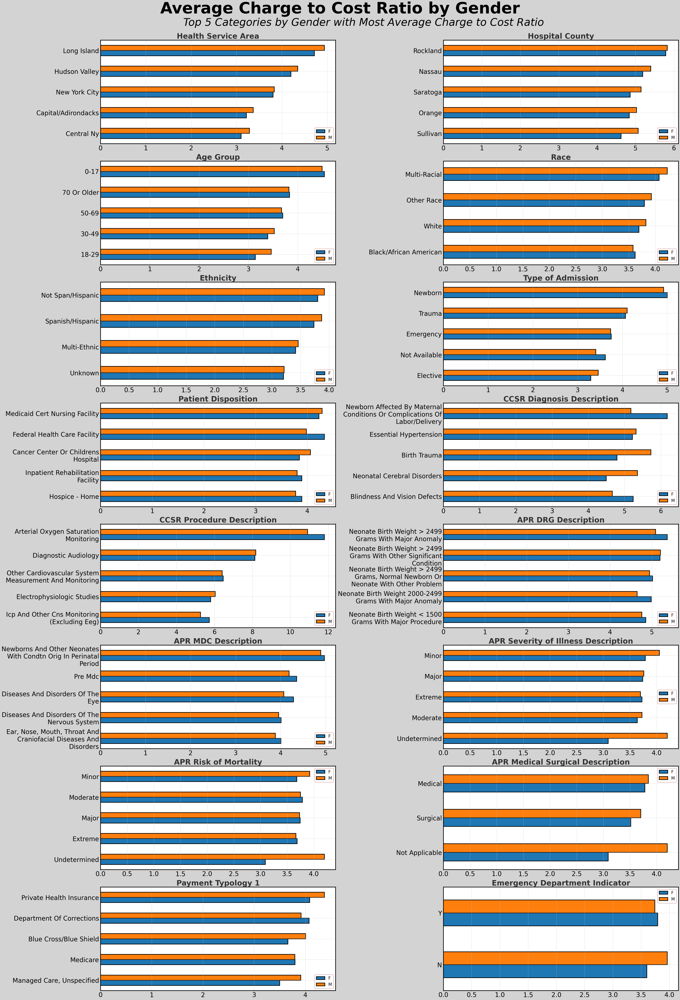

In [34]:
plot_cols = [col for col in df.select_dtypes('object').columns if 'code' not in col.lower() and col!='Gender']

top5_per_col = {col: df.groupby(col)['CCR'].mean().sort_values(ascending=False).head().index for col in plot_cols}
grouped = {col: df.groupby([col,'Gender'])['CCR'].mean().reset_index(name='Average CCR') for col in plot_cols}

n_cols=2
n_rows=math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows,n_cols,figsize=(45,8*n_rows))
axes = axes.flatten()

for ax,col in zip(axes,plot_cols):
    top5 = top5_per_col[col]
    top5 = top5[::-1]

    g = grouped[col][grouped[col][col].isin(top5)]
    pivot = g.pivot(index=col,columns='Gender',values='Average CCR').reindex(top5).fillna(0)

    wrapped_labels = [textwrap.fill(label.title(),width=30) for label in top5]
    
    pivot.plot.barh(ax=ax,edgecolor='black',linewidth=3)

    ax.set_ylabel('')
    ax.set_yticklabels(wrapped_labels)
    ax.set_title(col,fontsize=35,weight='bold')
    ax.tick_params(labelsize=30)
    ax.legend(fontsize=20)

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(3)

for i in range(len(plot_cols),len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.suptitle('Average Charge to Cost Ratio by Gender', weight='bold',y=1.03,fontsize=75)
plt.figtext(0.27,1.005,'Top 5 Categories by Gender with Most Average Charge to Cost Ratio',style='italic',fontsize=50,)
plt.show()

> The average `Charge to Cost Ratio` by Gender reveals 'Males' are mostly charged in most regions
>
> Males between 18 and 49 are charged more than females
>
> Black Females are charged more unlike other `Races`
>
> Ethnicity showed Males are charged more
>
> The difference between the Genders for Patients disposed to 'Federal Health Care Facility' and 'Cancer Center or Childrens Hospital' is clear, with Females charged more for the former and Males for the latter
>
> For 'Undetermined' cases of `Severity of Illness` and `Risk of Mortality`, Males are significanatly charged more than Females

### Percentage of Total Charges by Category

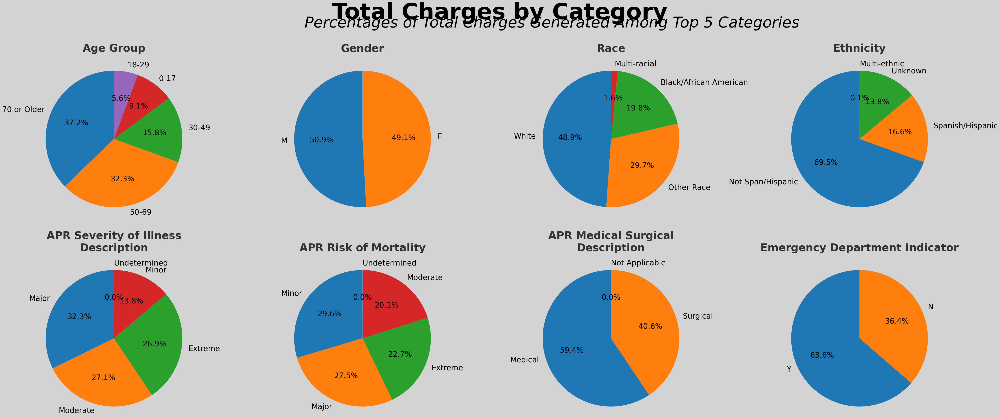

In [35]:
plot_cols = [col for col in df.select_dtypes('object') if 'code' not in col.lower() and df[col].nunique()<=5]

top5_per_col = {col: df.groupby(col)['Total Charges'].sum().sort_values(ascending=False).head() for col in plot_cols}

n_cols = 4
n_rows = math.ceil(len(plot_cols)/n_cols)

fig,axes = plt.subplots(n_rows, n_cols, figsize=(45,9*n_rows))
axes = axes.flatten()

for ax, col in zip(axes,plot_cols):
    top5 = top5_per_col[col]
        
    ax.pie(top5, labels=top5.index.tolist(), autopct='%1.1f%%', startangle=90, textprops={'fontsize':25},radius=1.1)
    ax.set_title(f'{textwrap.fill(col,width=30)}', fontsize=35, weight='bold',y=1.05)

for i in range(len(plot_cols),len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.suptitle('Total Charges by Category', fontsize=75, y=1.085, weight='bold')
plt.figtext(0.3,1.02,'Percentages of Total Charges Generated Among Top 5 Categories',style='italic',fontsize=50,)
plt.show()

> The pie charts show the percentage of total charges for different categorical variables in the dataset
>
> 59.4% of the `Total Charges` are incurred by 'Non-Surgical' procedures
>
> Approx 70% of the `Total Charges` incurred were from patients 50 years and above, the rest were shared amongst those below 50

### Total Charges vs Total Costs: Linear Regression

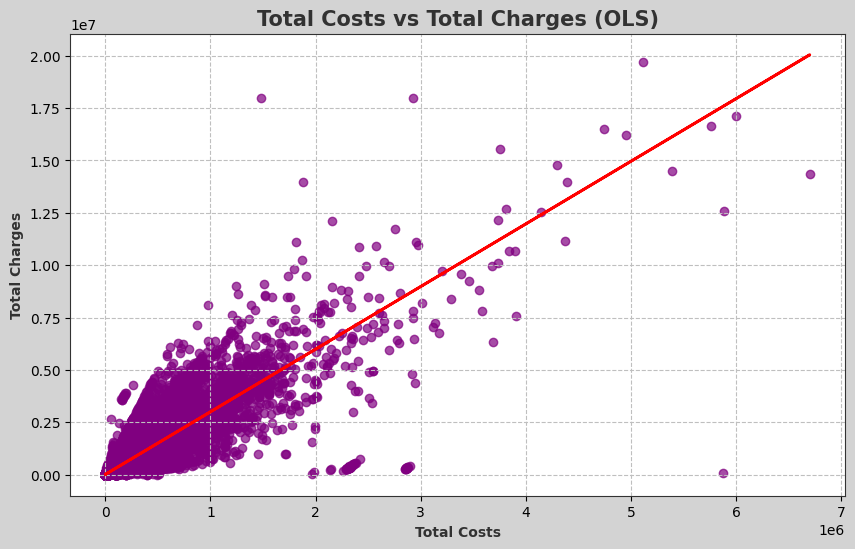

                            OLS Regression Results                            
Dep. Variable:          Total Charges   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                 7.083e+06
Date:                Sat, 13 Dec 2025   Prob (F-statistic):               0.00
Time:                        15:22:43   Log-Likelihood:            -2.8157e+07
No. Observations:             2191252   AIC:                         5.631e+07
Df Residuals:                 2191250   BIC:                         5.631e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.166e+04     68.959    169.123      

In [36]:
x = df['Total Costs']
y = df['Total Charges']

X = sm.add_constant(x)
model = sm.OLS(y, X).fit()

plt.figure(figsize=(10, 6))
plt.scatter(x, y, alpha=0.7,c='purple')

# regression line
plt.plot(x, model.predict(X), linewidth=2,color='red')

plt.title('Total Costs vs Total Charges (OLS)',weight='bold',fontsize=15)
plt.xlabel('Total Costs')
plt.ylabel('Total Charges')
plt.show()

print(model.summary())


> `Total Costs` explain 76.4% of `Total Charges`. Charges are strongly driven by Cost
>
> `Total Charges` is approx 3 times(2.99) of `Total Costs` on average
>
> The relationship is:

 * statistically strong (p-value = 0.000, t = 2661; astronomically greater than usual value of 2, F = 7.08e+06)
 * economically meaningful (coefficient approx 3, R2=0.764)
 * highly precise (standard error=0.001)


## Correlation Analysis

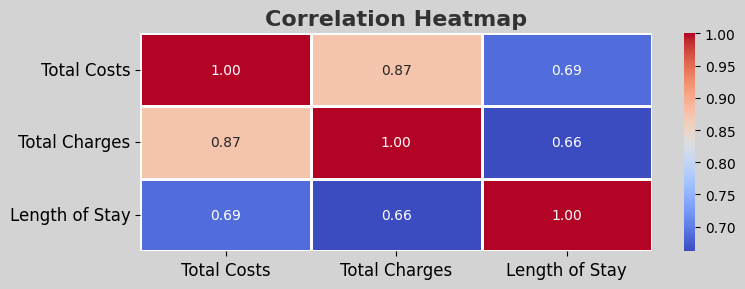

In [37]:
plt.figure(figsize=(8, 3))
corr = df[['Total Costs', 'Total Charges', 'Length of Stay']].corr()
sns.heatmap(corr,annot=True, cmap='coolwarm', fmt='.2f', linewidths=1)
plt.grid(False)
plt.title('Correlation Heatmap', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12, rotation=0)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
plt.show()

> There is a strong positive correlation between `Total Costs` and `Total Charges`, indicating that as the `Total Costs` increase, the `Total Charges` also tend to increase. This is expected as charges are typically based on the costs incurred during the hospital stay.
>
> A strong positive correlation between Total Costs and Total Charges reflects their cost-based linkage but also indicates potential multicollinearity, suggesting one may need to be excluded or transformed in modeling.